<a href="https://colab.research.google.com/github/7amokarim/breast-cancer-detection-system/blob/main/YOLO.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 29.7 MB/s eta 0:00:00


In [ ]:
from google.colab import files
uploaded=files.upload()

Saving yolodataset.zip to yolodataset.zip


In [ ]:
!unzip "/content/yolodataset.zip" -d /content/

Archive:  /content/yolodataset.zip
   creating: /content/yolodataset/
  inflating: /content/yolodataset/data.yaml  
  inflating: /content/yolodataset/README.dataset.txt  
  inflating: /content/yolodataset/README.roboflow.txt  
   creating: /content/yolodataset/test/
   creating: /content/yolodataset/test/images/
  inflating: /content/yolodataset/test/images/mdb001lm_jpg.rf.e9bea79d164b1e72a59d8bfc67eae682.jpg  
  inflating: /content/yolodataset/test/images/mdb002rl_jpg.rf.274ce2d69d7c23e3c3a5f942821224ed.jpg  
  inflating: /content/yolodataset/test/images/mdb012rl_jpg.rf.c3f42067ec1a1218b1bbbd18f18e7c63.jpg  
  inflating: /content/yolodataset/test/images/mdb013ll_jpg.rf.06809bd44b003338731a448b7df39c6d.jpg  
  inflating: /content/yolodataset/test/images/mdb015lm_jpg.rf.daf4dda40498cee4f1e3935879721eb7.jpg  
  inflating: /content/yolodataset/test/images/mdb025ll_jpg.rf.7f9ccc79d7748a977f6c312df54c94ae.jpg  
  inflating: /content/yolodataset/test/images/mdb030rm_jpg.rf.39aa2ef6528938b3e8

In [ ]:
DATA_PATH="/content/yolodataset"

In [ ]:
import glob

print("train labels:",len(glob.glob(DATA_PATH+"/train/labels/*.txt")))
print("valid labels:",len(glob.glob(DATA_PATH+"/valid/labels/*.txt")))
print("test labels:",len(glob.glob(DATA_PATH+"/test/labels/*.txt")))

train labels: 1281
valid labels: 240
test labels: 121


In [ ]:
files=glob.glob(DATA_PATH+"/train/labels/*.txt")

with open(files[0],"r") as f:
    print(f.read())

0 0.4859375 0.62421875 0.12109375 0.1578125


In [ ]:
import os

print(os.listdir(DATA_PATH))
print(os.listdir(DATA_PATH+"/train"))
print(os.listdir(DATA_PATH+"/train/images")[:5])
print(os.listdir(DATA_PATH+"/train/labels")[:5])

['valid', 'README.roboflow.txt', 'test', 'train', 'data.yaml', 'README.dataset.txt']
['labels', 'images', 'labels.cache']
['normal-237-_jpg.rf.ba954c09fa1469c8a1326f7dcaba1dce.jpg', 'mdb188rm_jpg.rf.4de9ec47b0da7447b41fbff77d4b8f37.jpg', 'normal-296-_jpg.rf.83c51c830a855d36bda36e17dfbe7c00.jpg', 'mdb209ll_jpg.rf.9a278dd72ee2875c5d4da34ee888e8db.jpg', 'mdb184rl_jpg.rf.92d12db7bc18fc3495b426213a4302b9.jpg']
['mdb248rl_jpg.rf.850390a149368b108b76f6f6e739ca9b.txt', 'mdb202rl_jpg.rf.33652ed11fb17de7e366c1180287d335.txt', 'normal-185-_jpg.rf.40a2a4eb059feb66fe4534a366b530a3.txt', 'mdb025ll_jpg.rf.2c1c273109afbef4fa47b9af65c2e3f2.txt', 'mdb059ls_jpg.rf.20f62c2da3815770ac06f4e97d1393c1.txt']


In [ ]:
yaml_content = """
path: /content/yolodataset

train: train/images
val: valid/images
test: test/images

nc: 2
names: ['cancer','normal']
"""

with open("/content/yolodataset/data.yaml","w") as f:
    f.write(yaml_content)

print("saved")

saved


In [ ]:
with open(DATA_PATH+"/data.yaml","r") as f:
    print(f.read())


path: /content/yolodataset

train: train/images
val: valid/images
test: test/images

nc: 2
names: ['cancer','normal']



In [ ]:
!rm -f /content/yolodataset/train/labels.cache
!rm -f /content/yolodataset/valid/labels.cache
!rm -f /content/yolodataset/test/labels.cache

In [ ]:
import glob
import random
import os

files=glob.glob("/content/yolodataset/train/labels/*.txt")

normal=[]

for f in files:
    if "normal" in os.path.basename(f):
        normal.append(f)

print("normal labels:",len(normal))

for x in random.sample(normal,5):

    print(x)

    with open(x) as f:
        print(f.read())

    print("----------")

normal labels: 281
/content/yolodataset/train/labels/normal-235-_jpg.rf.93a36d4e915e7e90d8081a9b66326c52.txt
1 0.2328125 0.50390625 0.465625 0.825
----------
/content/yolodataset/train/labels/normal-300-_jpg.rf.2e297b5ab5aa4fc4d7799a33492d3105.txt
1 0.70546875 0.5078125 0.58828125 0.7859375
----------
/content/yolodataset/train/labels/normal-406-_jpg.rf.9d14303b87831321abd990538e1c2b30.txt
1 0.60234375 0.41328125 0.7953125 0.8265625
----------
/content/yolodataset/train/labels/normal-186-_jpg.rf.c2ba609af495313a7a6af9a2fa320a1b.txt
0 0.52734375 0.47421875 0.57421875 0.3484375
----------
/content/yolodataset/train/labels/normal-52-_jpg.rf.15ccf0c511c2bc86c7debae4f608dc9f.txt
1 0.290625 0.58203125 0.58125 0.83046875
----------


In [ ]:
from ultralytics import YOLO

model=YOLO("yolov8n.pt")

results=model.train(
    data="/content/yolodataset/data.yaml",
    epochs=60,
    patience=10,
    imgsz=640,
    batch=16
)

Ultralytics 8.4.52 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/yolodataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=60, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train-2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=1

In [ ]:
metrics=model.val()
print(metrics)

Ultralytics 8.4.52 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Model summary (fused): 73 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1040.6±326.6 MB/s, size: 26.7 KB)
val: Scanning /content/yolodataset/valid/labels.cache... 240 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 240/240 100.7Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 15/15 4.2it/s 3.6s
                   all        240        251      0.925      0.925      0.912      0.749
                cancer        171        182      0.988      0.857      0.914      0.763
                normal         69         69      0.862      0.993       0.91      0.734
Speed: 2.5ms preprocess, 4.0ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to /content/runs/detect/val-2
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box:

In [ ]:
best_model=YOLO(
"/content/runs/detect/train/weights/best.pt"
)

In [ ]:
from google.colab import files

files.download(
"/content/runs/detect/train/weights/best.pt"
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


image 1/1 /content/yolodataset/test/images/normal-272-_jpg.rf.22e2e441e3073689760e9e3e9b59308d.jpg: 640x640 1 normal, 7.4ms
Speed: 2.1ms preprocess, 7.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


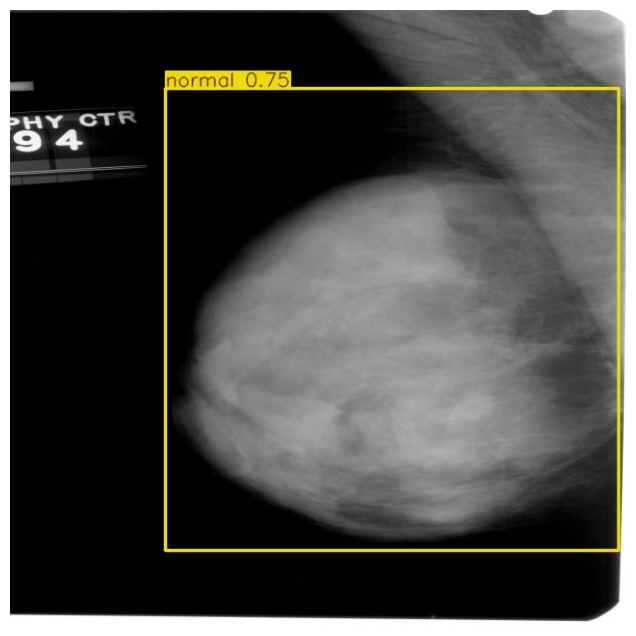

Prediction: normal
Confidence: 75.47 %
----------------

image 1/1 /content/yolodataset/test/images/normal-384-_jpg.rf.4bba3e3a8e45fae48fa38445c0f0e48a.jpg: 640x640 1 normal, 8.4ms
Speed: 2.2ms preprocess, 8.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


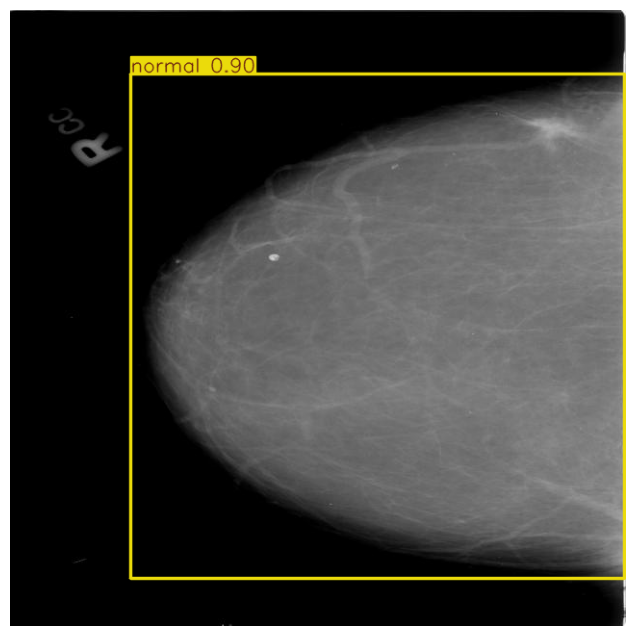

Prediction: normal
Confidence: 90.39 %
----------------

image 1/1 /content/yolodataset/test/images/normal-416-_jpg.rf.a6fd9f639a3438da4d2f1c8ab8da4c0c.jpg: 640x640 1 normal, 8.9ms
Speed: 2.3ms preprocess, 8.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


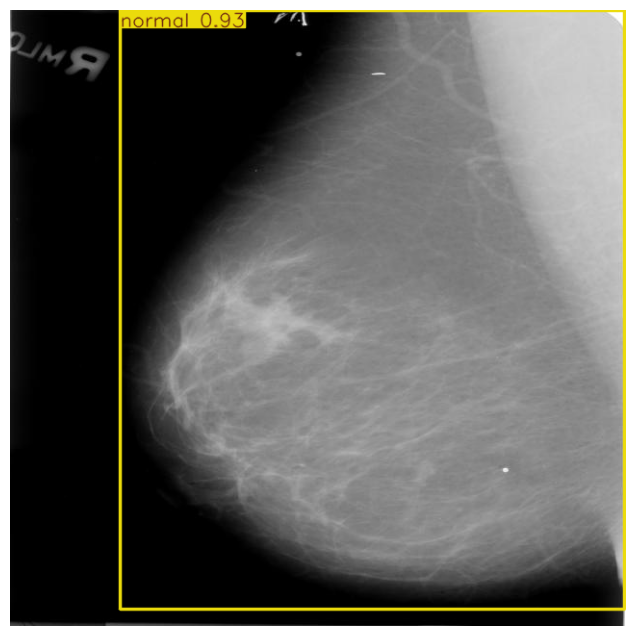

Prediction: normal
Confidence: 93.1 %
----------------

image 1/1 /content/yolodataset/test/images/mdb312rl_jpg.rf.ed6267cede3360c8ec0b34543a0f2c8c.jpg: 640x640 1 cancer, 8.8ms
Speed: 3.1ms preprocess, 8.8ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


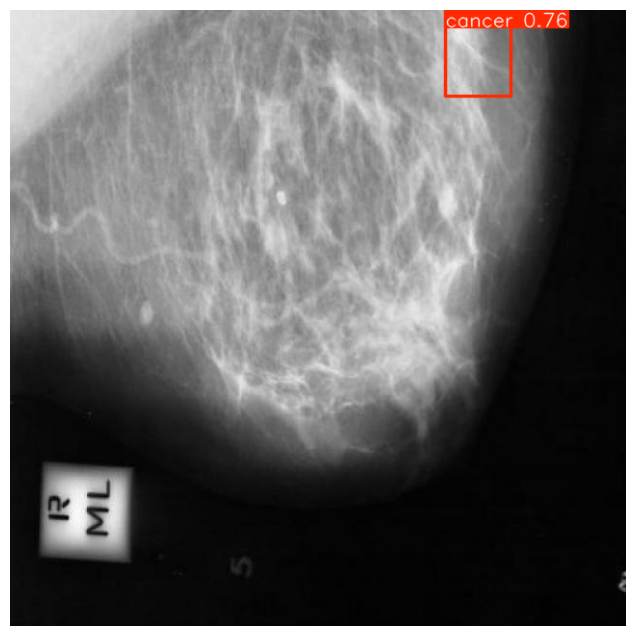

Prediction: cancer
Confidence: 75.85 %
----------------

image 1/1 /content/yolodataset/test/images/mdb222rm_jpg.rf.4e46fe7471d76c44f9c1c44a3cc101bd.jpg: 640x640 1 cancer, 8.5ms
Speed: 2.2ms preprocess, 8.5ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


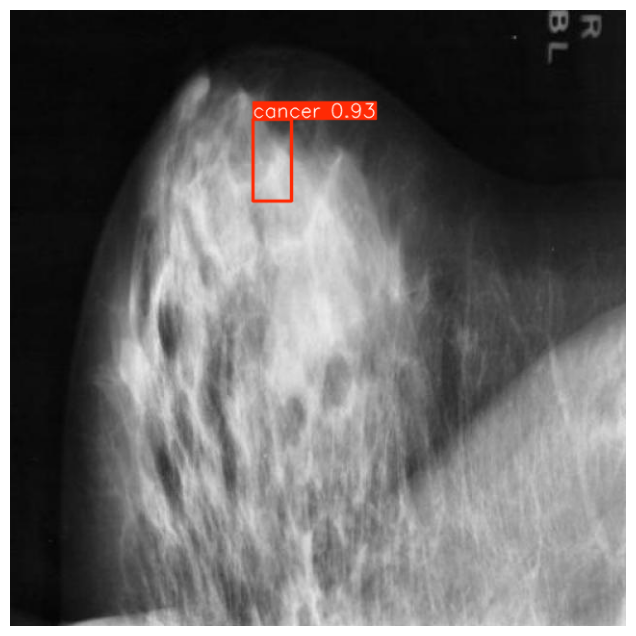

Prediction: cancer
Confidence: 93.35 %
----------------

image 1/1 /content/yolodataset/test/images/normal-390-_jpg.rf.5be3cf6de8020e1e9bac560f4dbc1cd7.jpg: 640x640 1 normal, 8.9ms
Speed: 2.2ms preprocess, 8.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


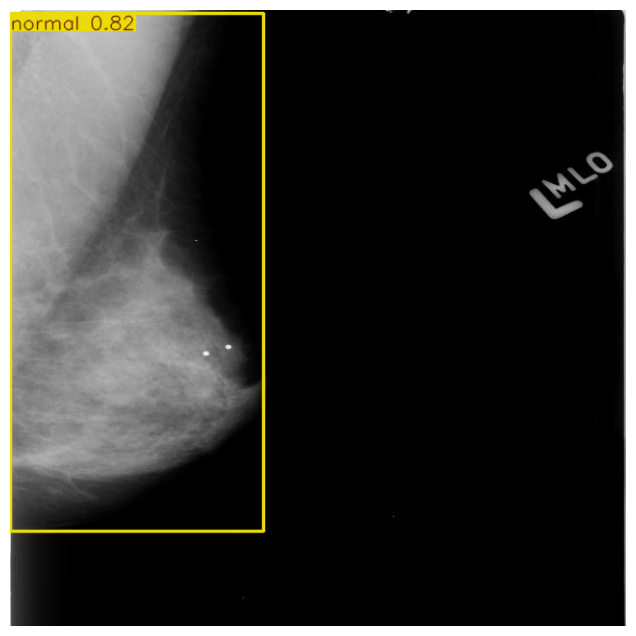

Prediction: normal
Confidence: 81.92 %
----------------

image 1/1 /content/yolodataset/test/images/normal-251-_jpg.rf.b16b1519c05531d0a749d2804a5c2062.jpg: 640x640 1 normal, 8.6ms
Speed: 2.6ms preprocess, 8.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


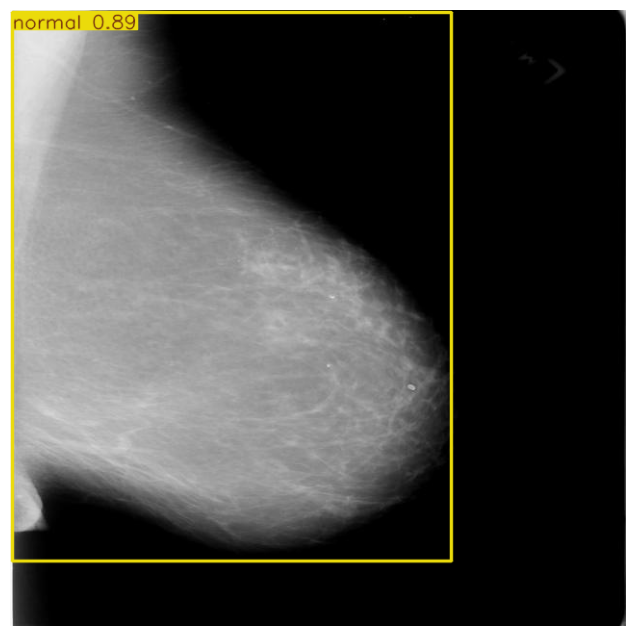

Prediction: normal
Confidence: 88.76 %
----------------

image 1/1 /content/yolodataset/test/images/mdb190rl_jpg.rf.4d97db02b08f6d21ec2d3b8095c1676c.jpg: 640x640 (no detections), 8.9ms
Speed: 2.2ms preprocess, 8.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


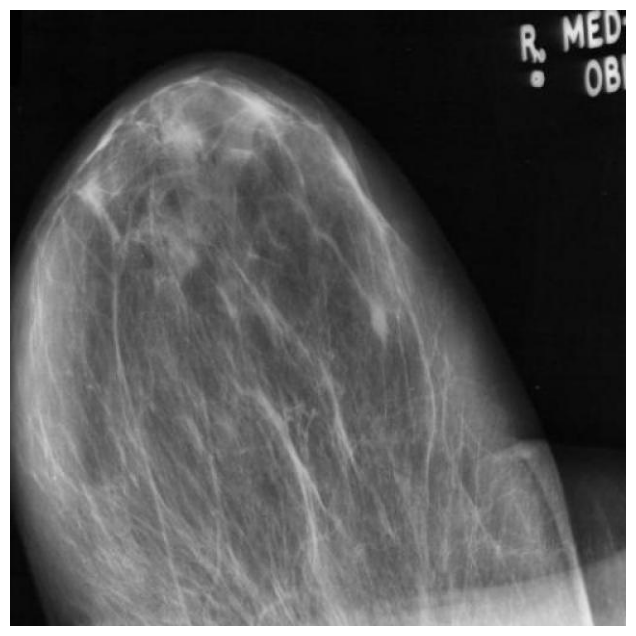

No detection
----------------

image 1/1 /content/yolodataset/test/images/mdb117ll_jpg.rf.34d2cd6e5985929186c05dc1d66637c9.jpg: 640x640 1 cancer, 9.2ms
Speed: 2.2ms preprocess, 9.2ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


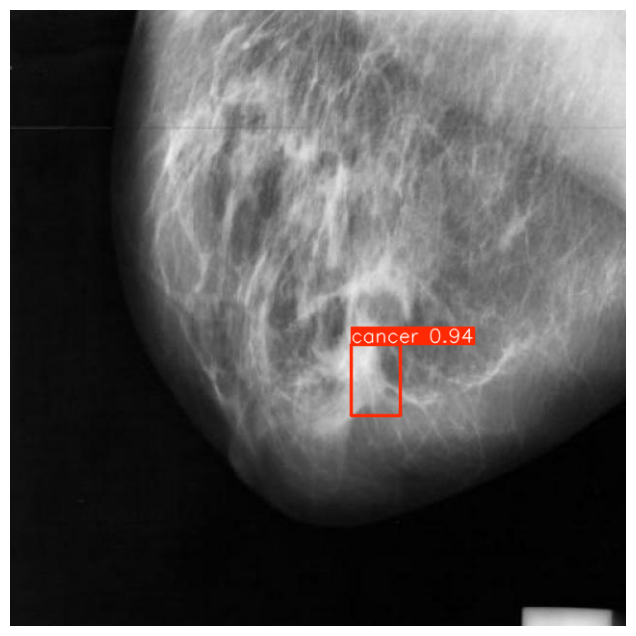

Prediction: cancer
Confidence: 93.88 %
----------------

image 1/1 /content/yolodataset/test/images/mdb241ls_jpg.rf.92e880c2195ca7e35f6d0b61735d1276.jpg: 640x640 2 cancers, 8.2ms
Speed: 2.6ms preprocess, 8.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


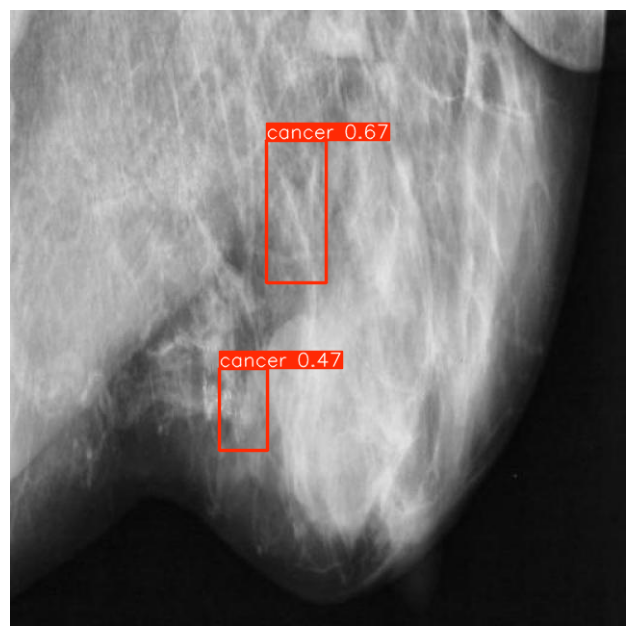

Prediction: cancer
Confidence: 67.29 %
Prediction: cancer
Confidence: 46.52 %
----------------

image 1/1 /content/yolodataset/test/images/mdb013ll_jpg.rf.06809bd44b003338731a448b7df39c6d.jpg: 640x640 1 cancer, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


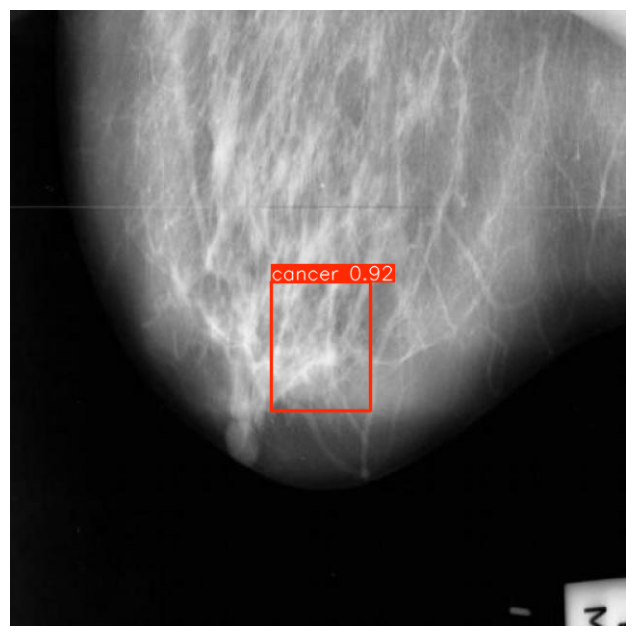

Prediction: cancer
Confidence: 91.75 %
----------------

image 1/1 /content/yolodataset/test/images/mdb148rx_jpg.rf.c976d7b84b7d17a4590c5ebbcf0e8d2e.jpg: 640x640 1 cancer, 8.3ms
Speed: 2.2ms preprocess, 8.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


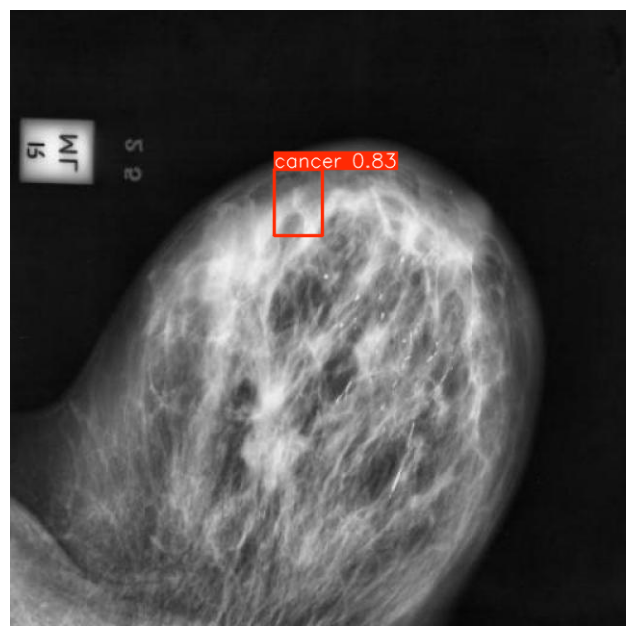

Prediction: cancer
Confidence: 82.61 %
----------------

image 1/1 /content/yolodataset/test/images/mdb105ll_jpg.rf.7bcad10400ba5383a43957a267727480.jpg: 640x640 (no detections), 8.2ms
Speed: 2.5ms preprocess, 8.2ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


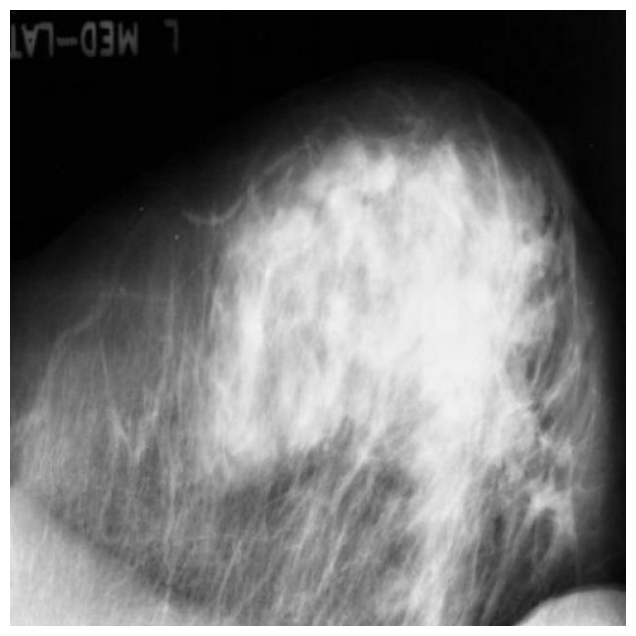

No detection
----------------

image 1/1 /content/yolodataset/test/images/mdb150rx_jpg.rf.b2e04852a9583962ed9f3c3b8b78ed45.jpg: 640x640 (no detections), 17.2ms
Speed: 2.7ms preprocess, 17.2ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


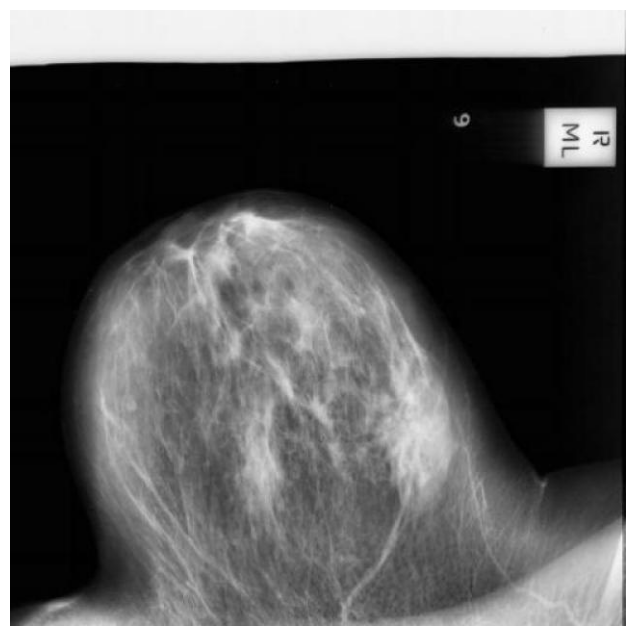

No detection
----------------

image 1/1 /content/yolodataset/test/images/normal-354-_jpg.rf.719f3eaced77b1ed08c459b9ce48412c.jpg: 640x640 1 normal, 12.3ms
Speed: 4.7ms preprocess, 12.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


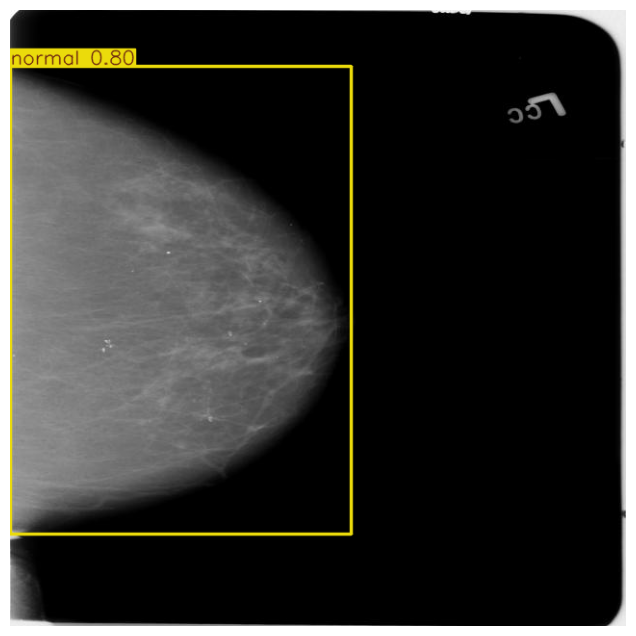

Prediction: normal
Confidence: 80.05 %
----------------

image 1/1 /content/yolodataset/test/images/normal-357-_jpg.rf.3325099520cea0ce8fc3b93fbd482a4d.jpg: 640x640 1 normal, 9.8ms
Speed: 3.5ms preprocess, 9.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


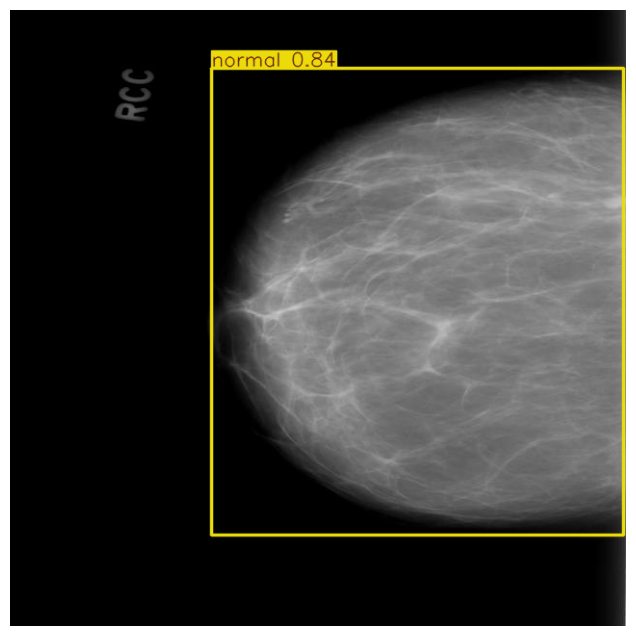

Prediction: normal
Confidence: 83.53 %
----------------

image 1/1 /content/yolodataset/test/images/mdb104rm_jpg.rf.37bfafc8c75ee793a1d165607c18e679.jpg: 640x640 1 cancer, 9.2ms
Speed: 2.2ms preprocess, 9.2ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


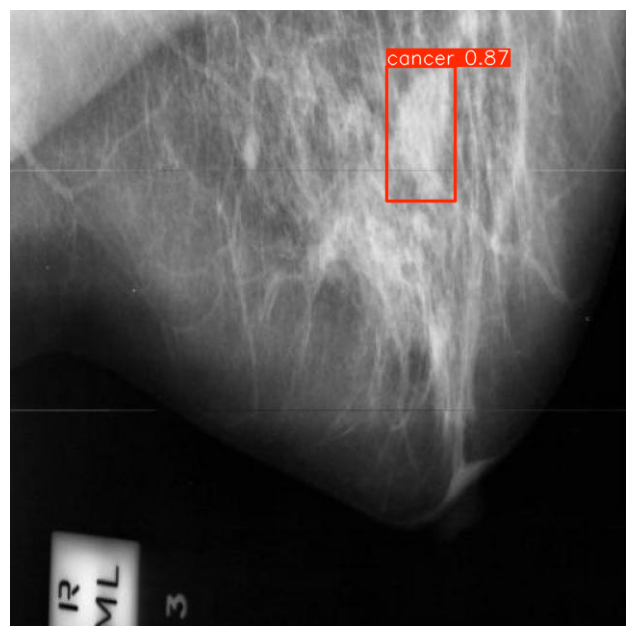

Prediction: cancer
Confidence: 86.69 %
----------------

image 1/1 /content/yolodataset/test/images/mdb132rx_jpg.rf.fbd0f760a63dcc3792ebaf10b2702a96.jpg: 640x640 2 cancers, 10.0ms
Speed: 2.7ms preprocess, 10.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


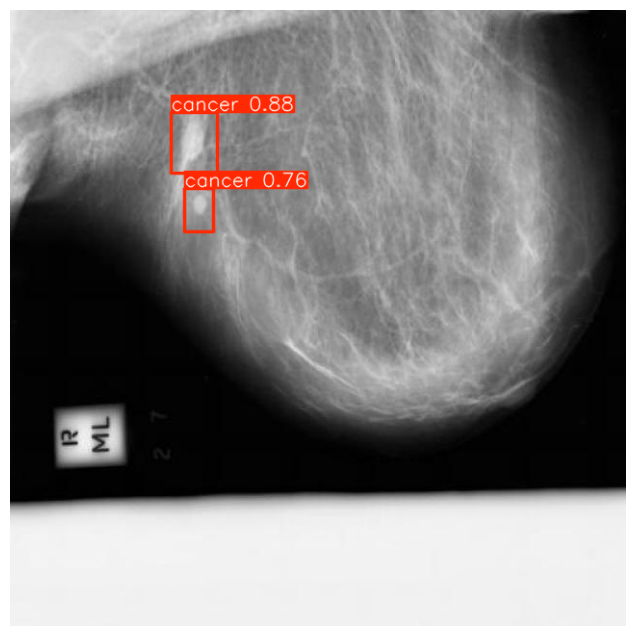

Prediction: cancer
Confidence: 88.14 %
Prediction: cancer
Confidence: 75.72 %
----------------

image 1/1 /content/yolodataset/test/images/mdb204rl_jpg.rf.f11399d7cdc287f89dfeb7ad2ba1c5f2.jpg: 640x640 1 cancer, 8.8ms
Speed: 3.2ms preprocess, 8.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


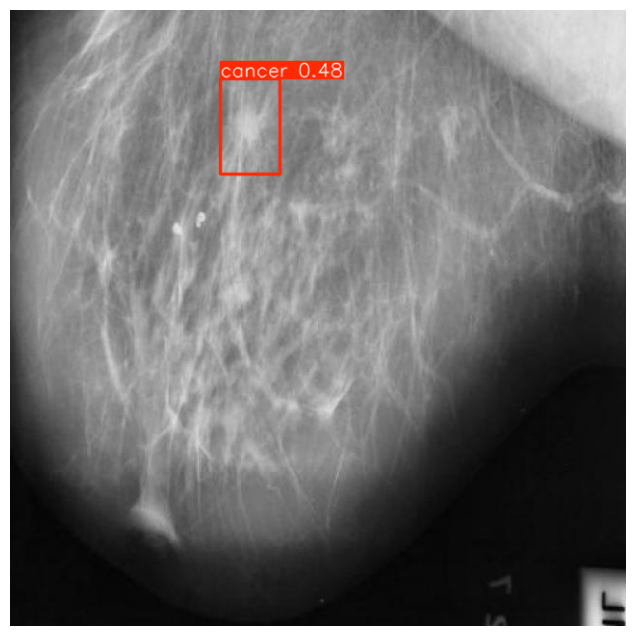

Prediction: cancer
Confidence: 48.22 %
----------------

image 1/1 /content/yolodataset/test/images/mdb125ll_jpg.rf.4edd50276c9d06fd11c1007eed0a75ca.jpg: 640x640 2 cancers, 8.5ms
Speed: 2.6ms preprocess, 8.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


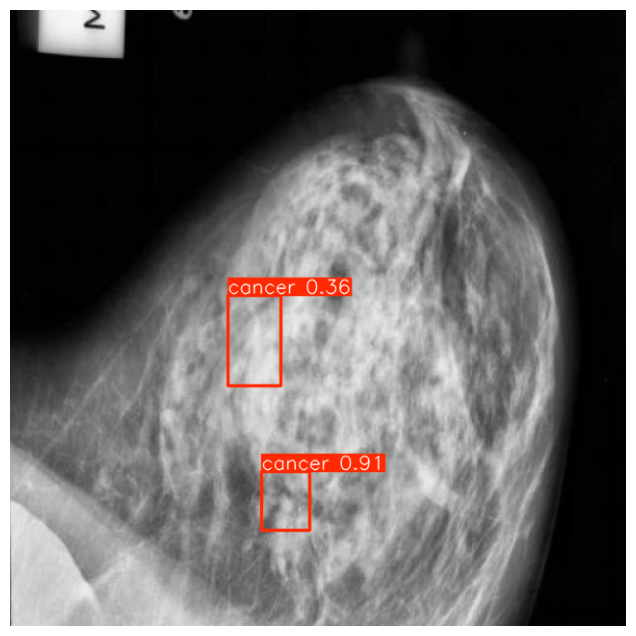

Prediction: cancer
Confidence: 90.54 %
Prediction: cancer
Confidence: 35.56 %
----------------

image 1/1 /content/yolodataset/test/images/normal-73-_jpg.rf.cb3dc4bfaca5d4640d5c1dc61314eecd.jpg: 640x640 1 normal, 11.1ms
Speed: 2.2ms preprocess, 11.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


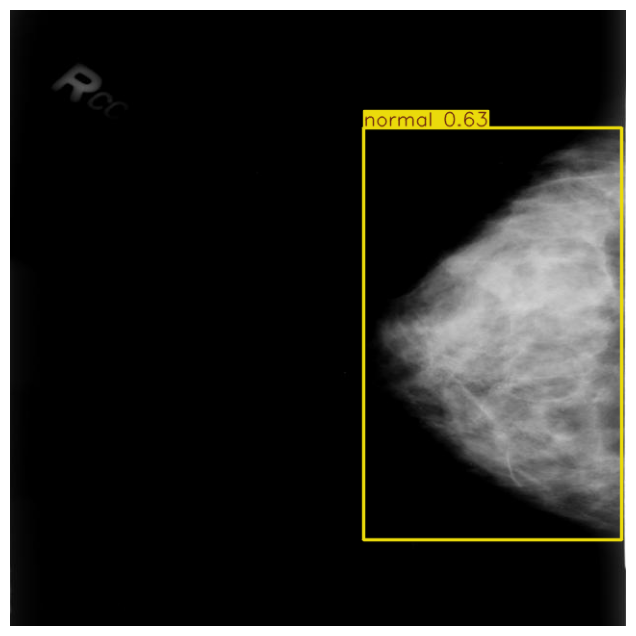

Prediction: normal
Confidence: 63.26 %
----------------

image 1/1 /content/yolodataset/test/images/mdb120rl_jpg.rf.bc8a066db587bfe0b8cd5d2aaa62cf9b.jpg: 640x640 1 cancer, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


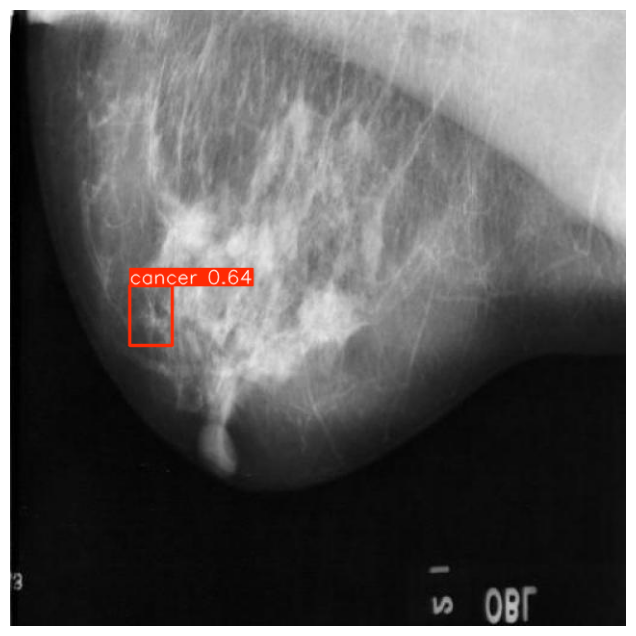

Prediction: cancer
Confidence: 63.67 %
----------------

image 1/1 /content/yolodataset/test/images/mdb181lm_jpg.rf.37df3a5c41c4dd743c2a477087552120.jpg: 640x640 1 cancer, 10.0ms
Speed: 2.2ms preprocess, 10.0ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


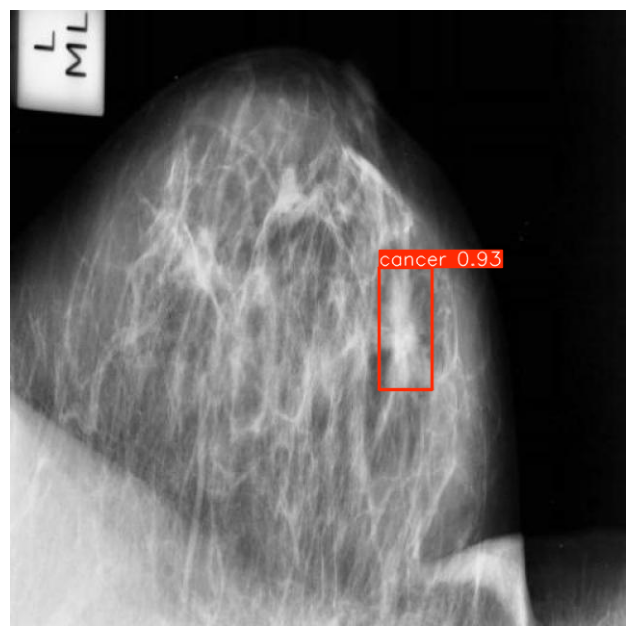

Prediction: cancer
Confidence: 92.73 %
----------------

image 1/1 /content/yolodataset/test/images/normal-383-_jpg.rf.b7cbe54fa10e9adf55080a9471faaeaf.jpg: 640x640 1 normal, 9.8ms
Speed: 2.2ms preprocess, 9.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


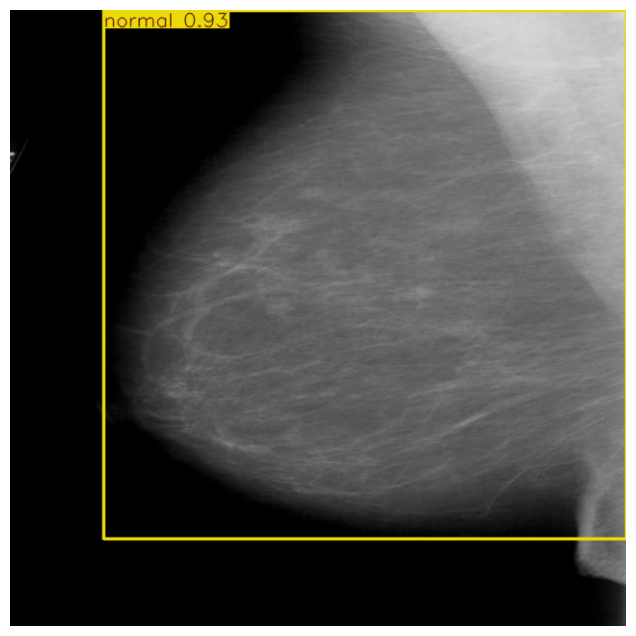

Prediction: normal
Confidence: 93.14 %
----------------

image 1/1 /content/yolodataset/test/images/normal-88-_jpg.rf.dea3a9e6e4fdd8dc30380fd0c501fa07.jpg: 640x640 1 normal, 9.4ms
Speed: 2.3ms preprocess, 9.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


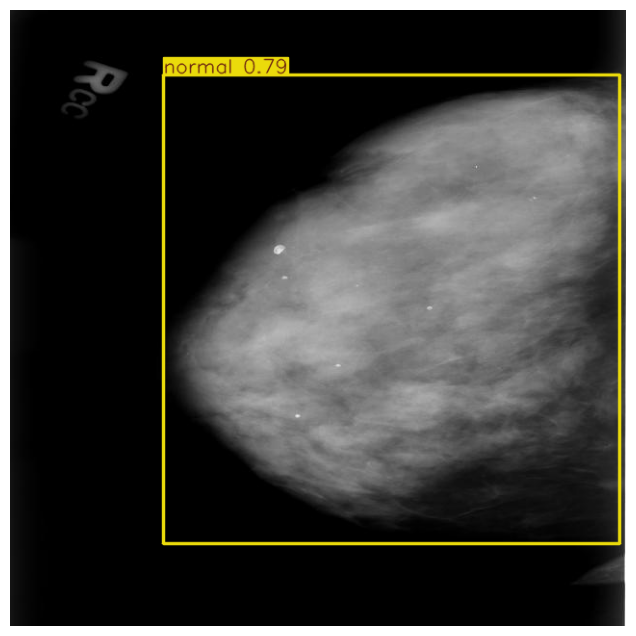

Prediction: normal
Confidence: 78.87 %
----------------

image 1/1 /content/yolodataset/test/images/normal-281-_jpg.rf.dbabf3ce24124dd02a436708d26355a2.jpg: 640x640 1 normal, 9.2ms
Speed: 2.2ms preprocess, 9.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


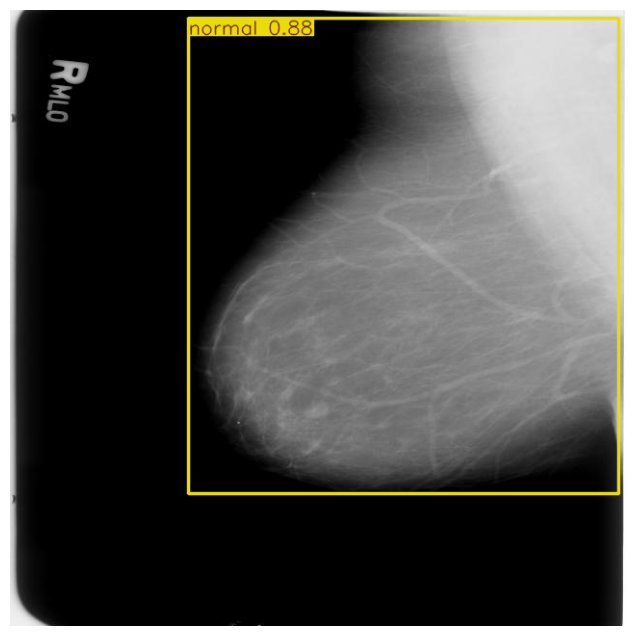

Prediction: normal
Confidence: 87.83 %
----------------

image 1/1 /content/yolodataset/test/images/mdb198rm_jpg.rf.01fa808c5c16819432844aacf32d1a6e.jpg: 640x640 1 cancer, 10.0ms
Speed: 2.9ms preprocess, 10.0ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


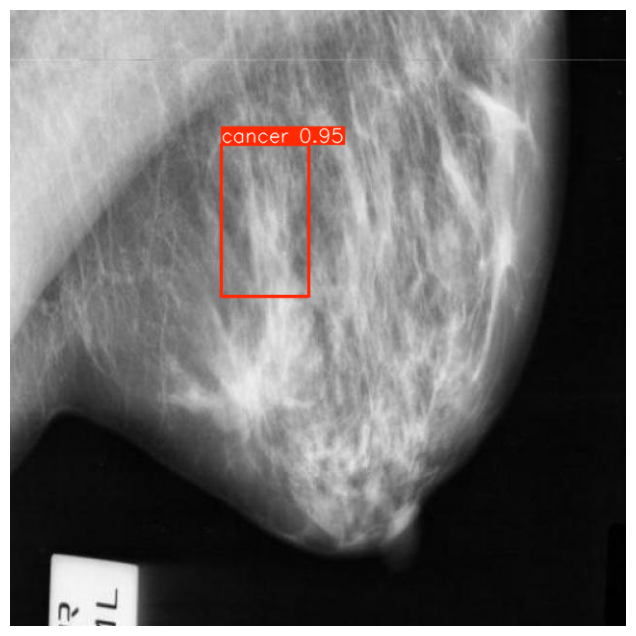

Prediction: cancer
Confidence: 94.57 %
----------------

image 1/1 /content/yolodataset/test/images/normal-3-_jpg.rf.721583bdc087d20f0bb98619929b42e9.jpg: 640x640 1 normal, 9.5ms
Speed: 2.3ms preprocess, 9.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


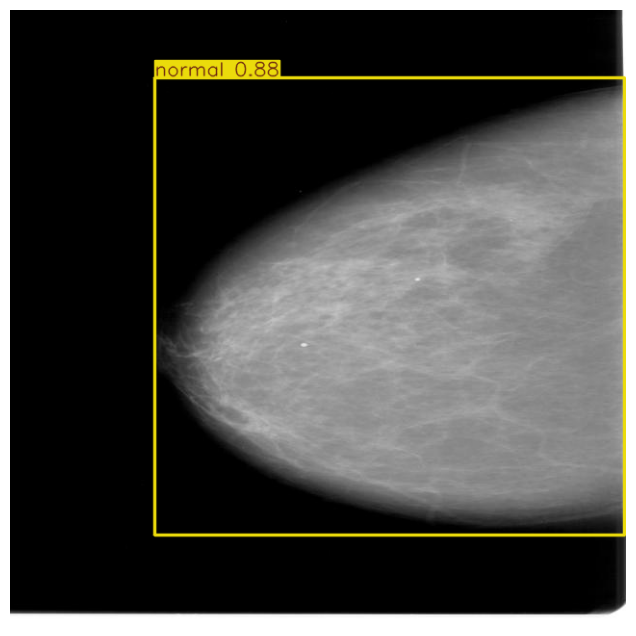

Prediction: normal
Confidence: 88.48 %
----------------

image 1/1 /content/yolodataset/test/images/mdb230rl_jpg.rf.28225aa43d379ea13077840cc1b09af1.jpg: 640x640 1 cancer, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


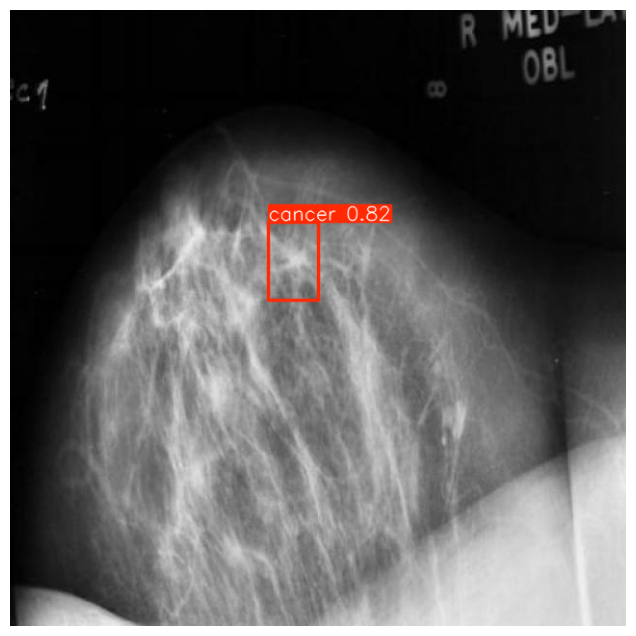

Prediction: cancer
Confidence: 81.9 %
----------------

image 1/1 /content/yolodataset/test/images/normal-373-_jpg.rf.3a095e4272a761c6350c5307f32f3af3.jpg: 640x640 1 normal, 8.6ms
Speed: 4.2ms preprocess, 8.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


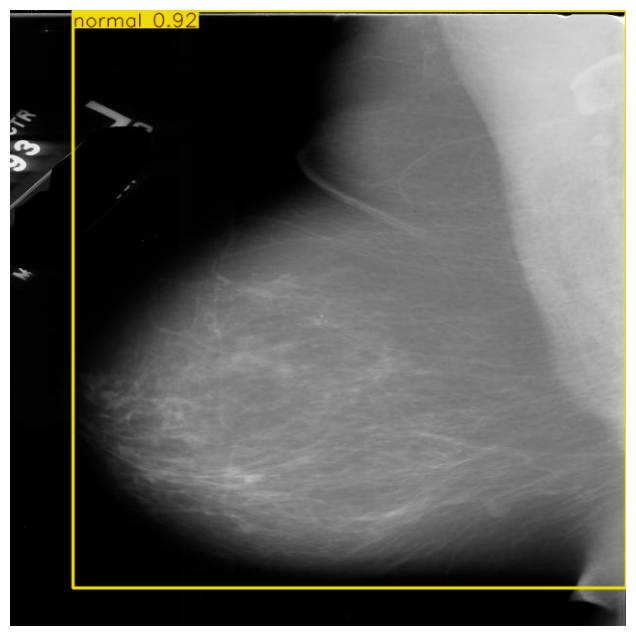

Prediction: normal
Confidence: 92.19 %
----------------

image 1/1 /content/yolodataset/test/images/mdb081ll_jpg.rf.4a3a28b6df366cddd3ff7e2426baace1.jpg: 640x640 1 cancer, 14.2ms
Speed: 2.2ms preprocess, 14.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


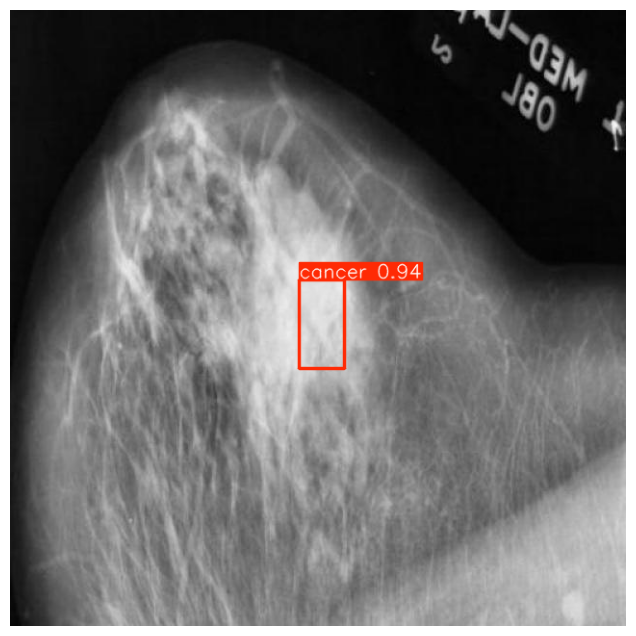

Prediction: cancer
Confidence: 94.07 %
----------------

image 1/1 /content/yolodataset/test/images/normal-74-_jpg.rf.9baf9d2e0f8e5b1fff189de14124ba78.jpg: 640x640 1 normal, 13.4ms
Speed: 2.2ms preprocess, 13.4ms inference, 3.7ms postprocess per image at shape (1, 3, 640, 640)


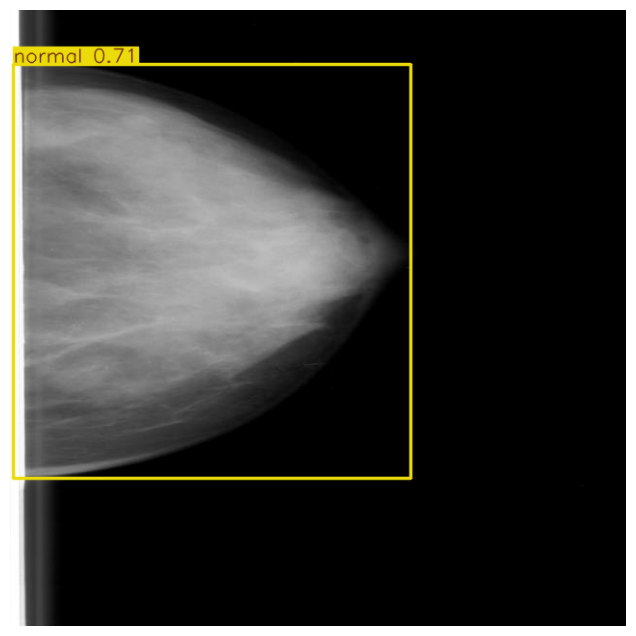

Prediction: normal
Confidence: 70.71 %
----------------

image 1/1 /content/yolodataset/test/images/mdb315ll_jpg.rf.41c9d684470c90eae77f8ae6a3970168.jpg: 640x640 1 cancer, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


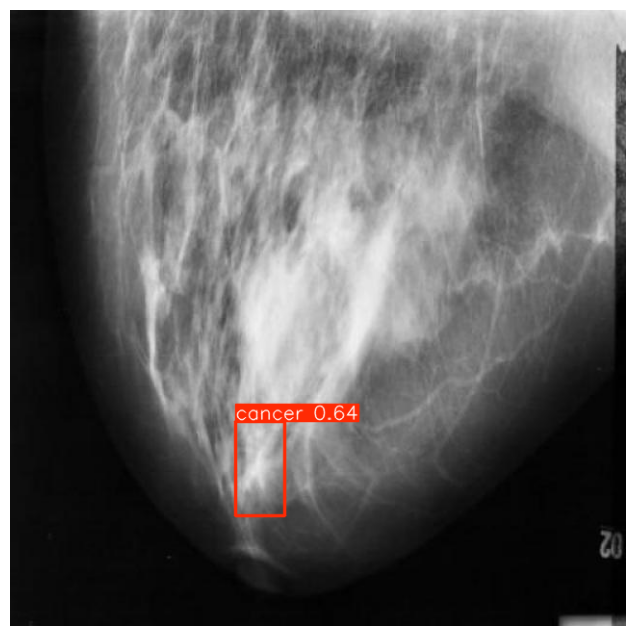

Prediction: cancer
Confidence: 63.5 %
----------------

image 1/1 /content/yolodataset/test/images/mdb232rl_jpg.rf.2f578abe89ced8cf71319dd38ed0d216.jpg: 640x640 1 cancer, 12.1ms
Speed: 2.2ms preprocess, 12.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


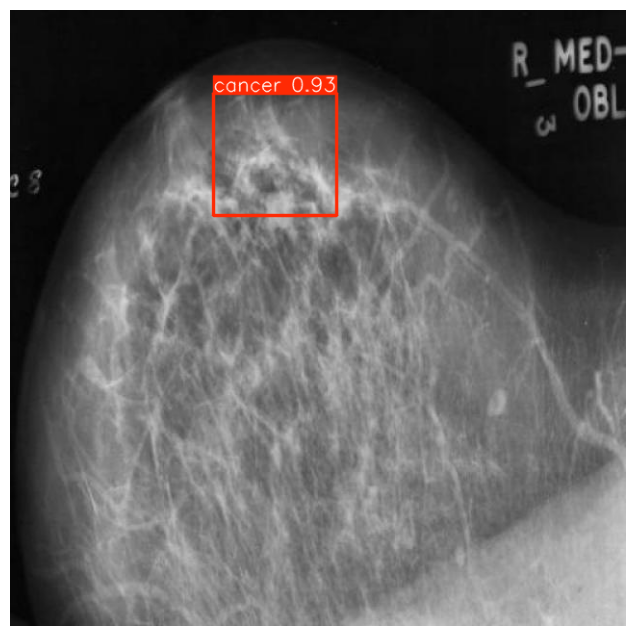

Prediction: cancer
Confidence: 92.75 %
----------------

image 1/1 /content/yolodataset/test/images/mdb223ls_jpg.rf.fa1771b8e340a1b1d993a44595d5e72a.jpg: 640x640 1 cancer, 12.5ms
Speed: 2.2ms preprocess, 12.5ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


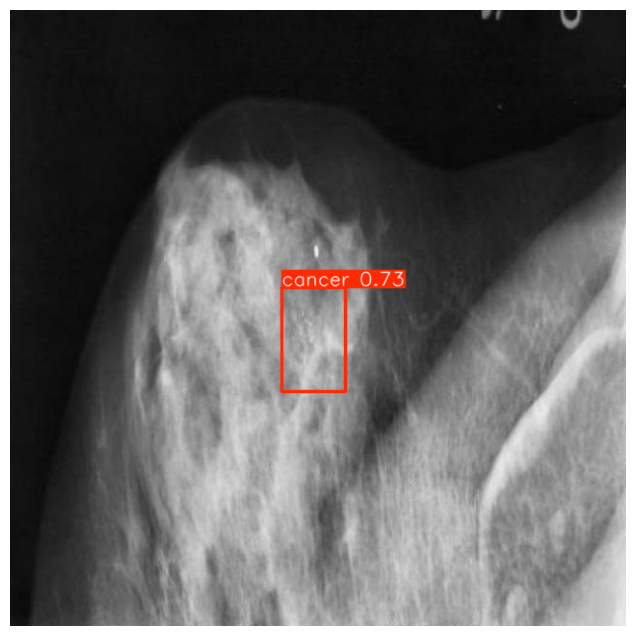

Prediction: cancer
Confidence: 72.77 %
----------------

image 1/1 /content/yolodataset/test/images/mdb097ll_jpg.rf.b4c32cc0fa87f7d12e9c8424e1fbed5a.jpg: 640x640 1 cancer, 12.6ms
Speed: 3.2ms preprocess, 12.6ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


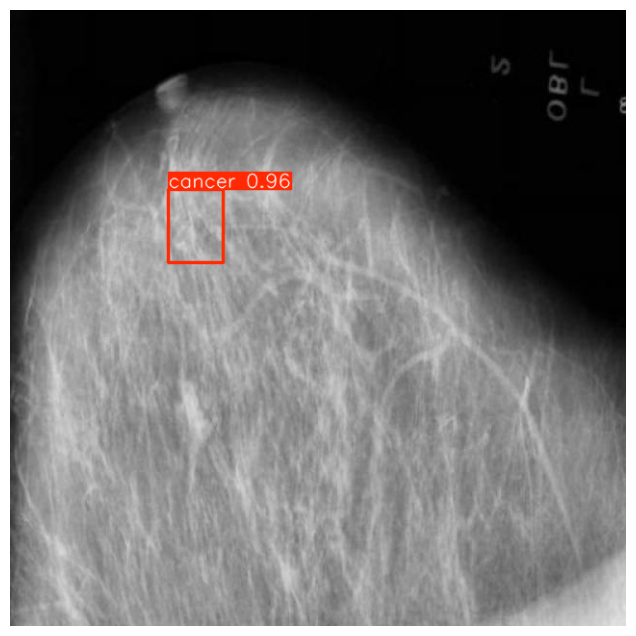

Prediction: cancer
Confidence: 95.7 %
----------------

image 1/1 /content/yolodataset/test/images/mdb092rm_jpg.rf.37984b6ead631c1cfb94ee5a9ee1538c.jpg: 640x640 1 cancer, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


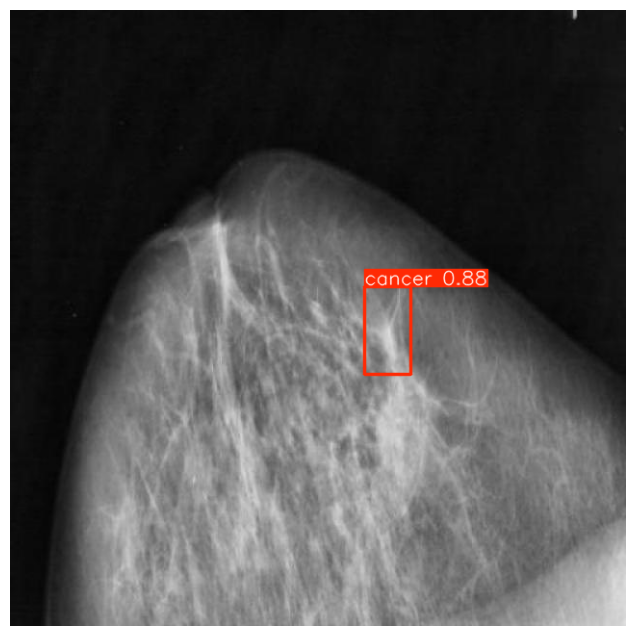

Prediction: cancer
Confidence: 87.79 %
----------------

image 1/1 /content/yolodataset/test/images/mdb314rl_jpg.rf.dd17230ca673000dc8209949db598210.jpg: 640x640 1 cancer, 9.2ms
Speed: 2.2ms preprocess, 9.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


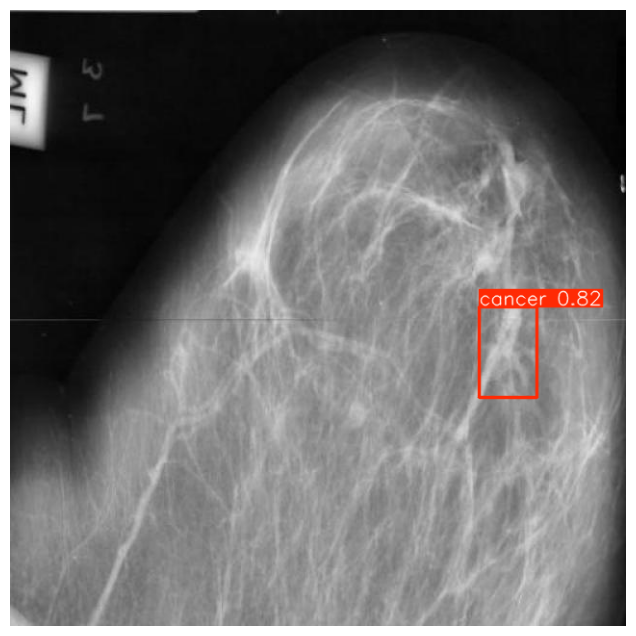

Prediction: cancer
Confidence: 81.84 %
----------------

image 1/1 /content/yolodataset/test/images/normal-396-_jpg.rf.f60063949697966b36652dfc3c12d1ee.jpg: 640x640 1 normal, 11.6ms
Speed: 3.4ms preprocess, 11.6ms inference, 3.8ms postprocess per image at shape (1, 3, 640, 640)


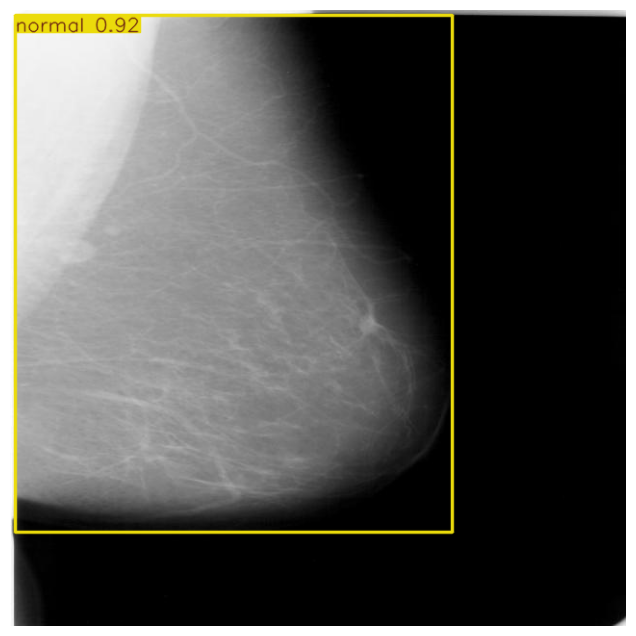

Prediction: normal
Confidence: 92.31 %
----------------

image 1/1 /content/yolodataset/test/images/normal-245-_jpg.rf.b62c27c65ddb6e745ea909af9c83072e.jpg: 640x640 1 normal, 9.6ms
Speed: 2.3ms preprocess, 9.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


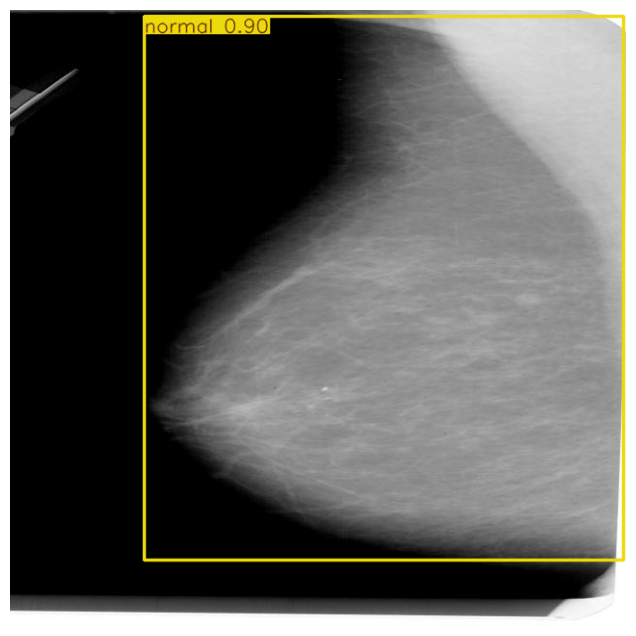

Prediction: normal
Confidence: 89.96 %
----------------

image 1/1 /content/yolodataset/test/images/mdb127lm_jpg.rf.e4bd9bd0a779a7b82360791215e8aa03.jpg: 640x640 1 cancer, 9.8ms
Speed: 3.7ms preprocess, 9.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


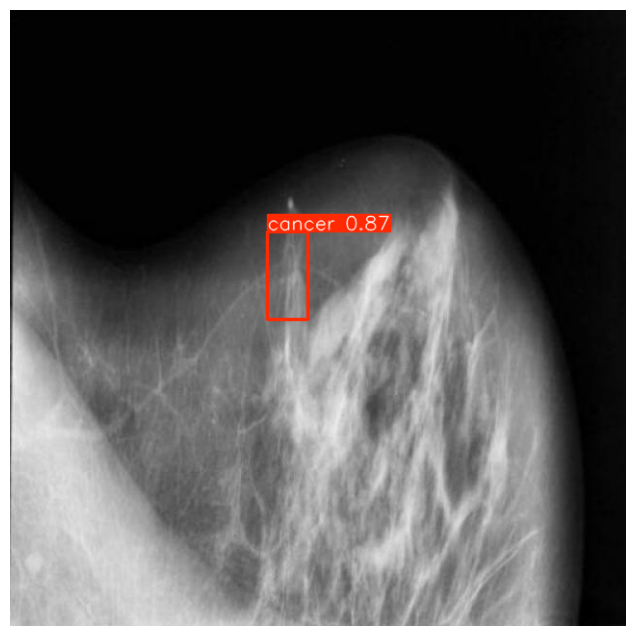

Prediction: cancer
Confidence: 87.05 %
----------------

image 1/1 /content/yolodataset/test/images/mdb069ll_jpg.rf.19a9ecbf29d1d33c8f389ad3dd6f748d.jpg: 640x640 2 cancers, 8.5ms
Speed: 3.4ms preprocess, 8.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


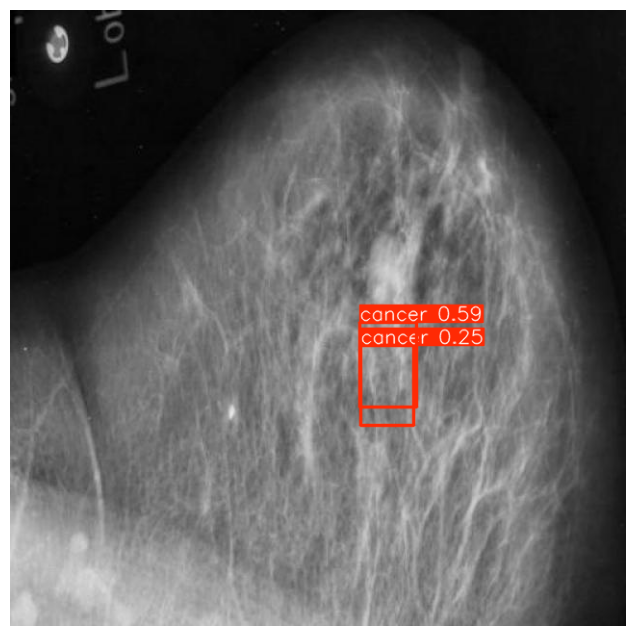

Prediction: cancer
Confidence: 59.25 %
Prediction: cancer
Confidence: 25.0 %
----------------

image 1/1 /content/yolodataset/test/images/normal-401-_jpg.rf.5a4eac203ac05c59d97ee4849331f59a.jpg: 640x640 1 normal, 16.7ms
Speed: 2.3ms preprocess, 16.7ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


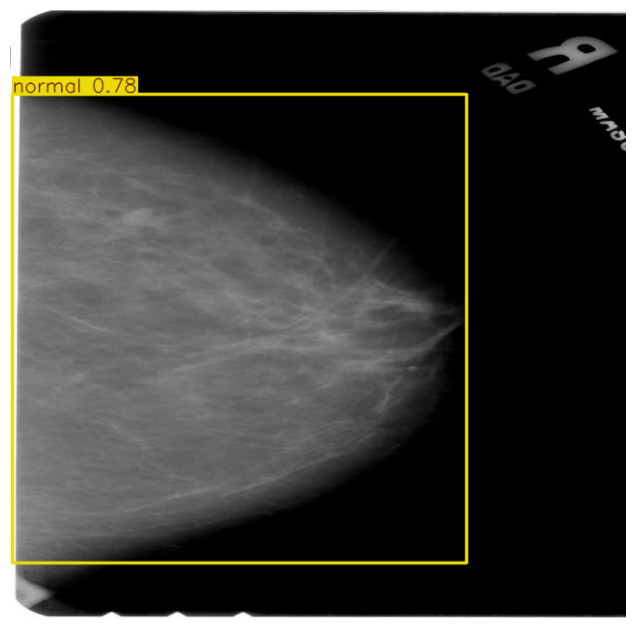

Prediction: normal
Confidence: 77.63 %
----------------

image 1/1 /content/yolodataset/test/images/normal-2-_jpg.rf.242d92773c75abdc6c9cd575921adb91.jpg: 640x640 1 normal, 14.0ms
Speed: 2.1ms preprocess, 14.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


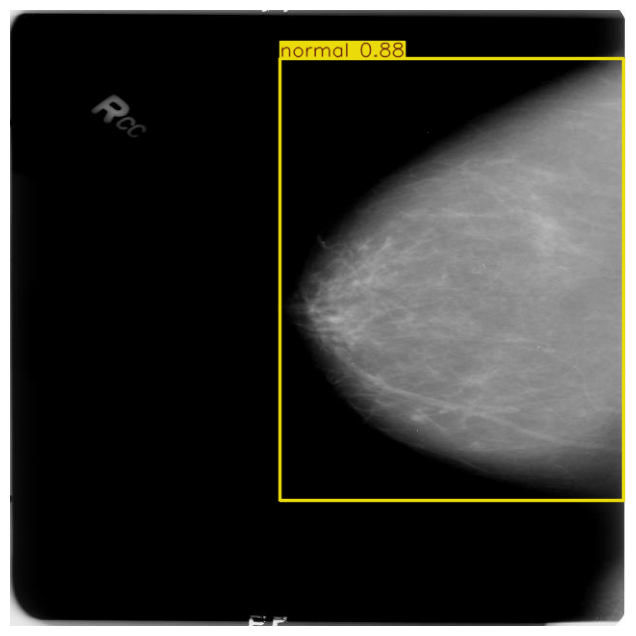

Prediction: normal
Confidence: 87.69 %
----------------

image 1/1 /content/yolodataset/test/images/mdb312rl_jpg.rf.f39ed5cce5d4ba1df2099b75552d90a5.jpg: 640x640 2 cancers, 14.2ms
Speed: 2.2ms preprocess, 14.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


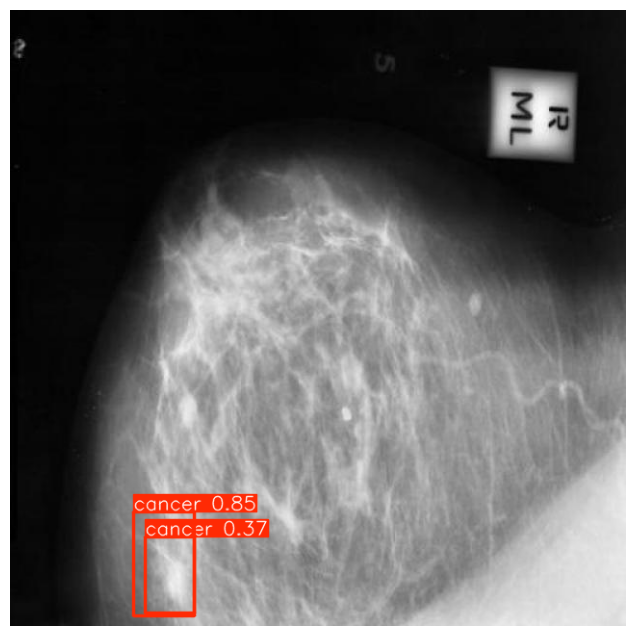

Prediction: cancer
Confidence: 84.96 %
Prediction: cancer
Confidence: 36.6 %
----------------

image 1/1 /content/yolodataset/test/images/mdb270rm_jpg.rf.4ea391f08f7a9777dfc9ccaf6bc0b345.jpg: 640x640 1 cancer, 11.4ms
Speed: 2.6ms preprocess, 11.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


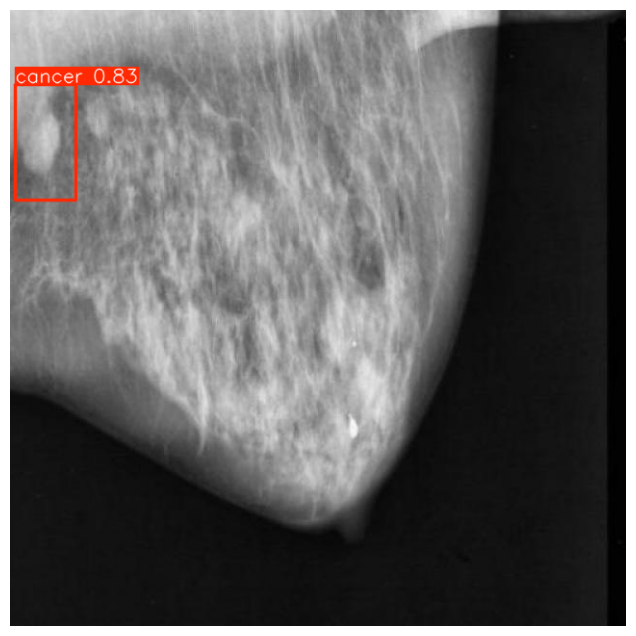

Prediction: cancer
Confidence: 82.62 %
----------------

image 1/1 /content/yolodataset/test/images/mdb032rl_jpg.rf.a75f483a883cca9da92545890ccec2a6.jpg: 640x640 1 cancer, 8.9ms
Speed: 2.1ms preprocess, 8.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


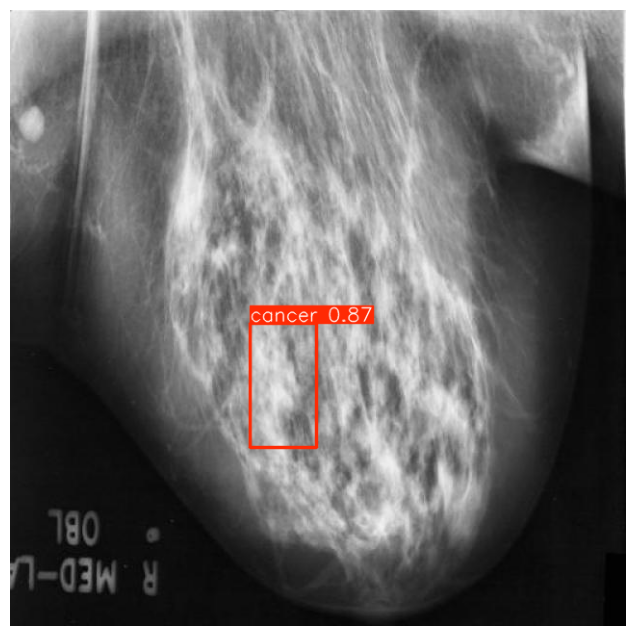

Prediction: cancer
Confidence: 86.92 %
----------------

image 1/1 /content/yolodataset/test/images/mdb117ll_jpg.rf.6b383a2ac1bf4733ff659d5143ed14b3.jpg: 640x640 1 cancer, 8.4ms
Speed: 2.2ms preprocess, 8.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


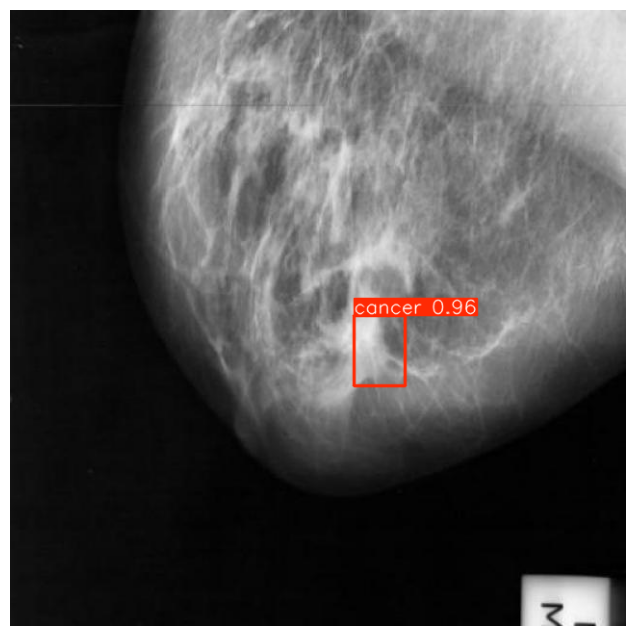

Prediction: cancer
Confidence: 95.95 %
----------------

image 1/1 /content/yolodataset/test/images/normal-345-_jpg.rf.f7504edc5b308d0f5c7c676a055fb4e2.jpg: 640x640 1 normal, 9.1ms
Speed: 2.3ms preprocess, 9.1ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


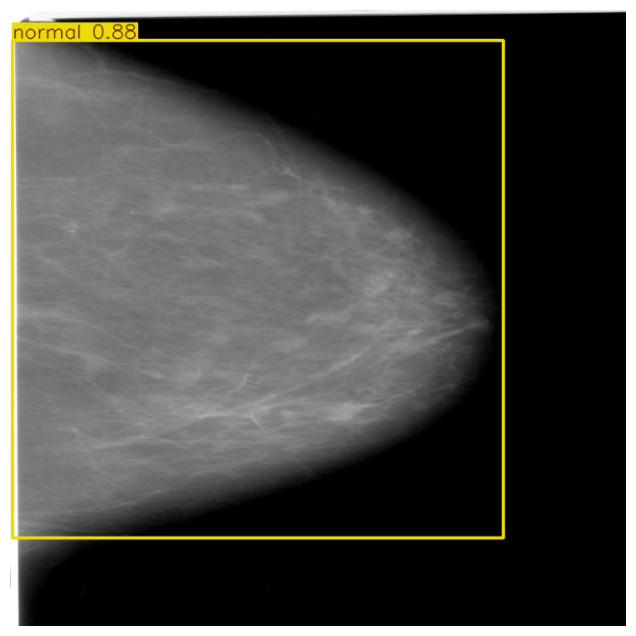

Prediction: normal
Confidence: 87.54 %
----------------

image 1/1 /content/yolodataset/test/images/normal-182-_jpg.rf.13b236105311d3b1890d10db8963a144.jpg: 640x640 1 normal, 8.9ms
Speed: 2.2ms preprocess, 8.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


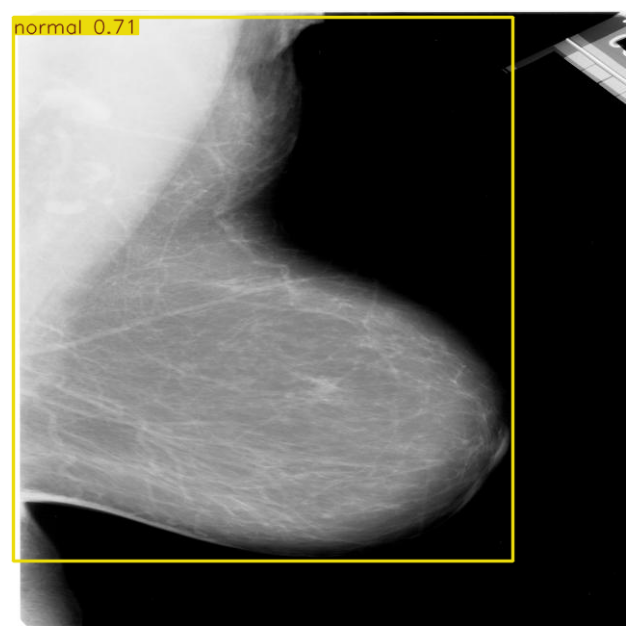

Prediction: normal
Confidence: 71.49 %
----------------


In [ ]:
from ultralytics import YOLO
import os
import random
import matplotlib.pyplot as plt


model=YOLO(
"/content/runs/detect/train/weights/best.pt"
)

folder="/content/yolodataset/test/images"

imgs=os.listdir(folder)

sample=random.sample(
    imgs,
    min(50,len(imgs))
)

for img in sample:

    path=os.path.join(folder,img)

    results=model(path)

    output=results[0].plot()

    plt.figure(figsize=(8,8))
    plt.imshow(output)
    plt.axis("off")
    plt.show()

    boxes=results[0].boxes

    if len(boxes)>0:

        for box in boxes:

            cls=int(box.cls)
            conf=float(box.conf)

            print(
                "Prediction:",
                model.names[cls]
            )

            print(
                "Confidence:",
                round(conf*100,2),
                "%"
            )

    else:

        print("No detection")

    print("----------------")